In [3]:
import pandas as pd
import numpy as np
from pathlib import Path
from PIL import Image, ImageDraw
import matplotlib.pyplot as plt
import os
from scipy import ndimage
from tqdm.notebook import tqdm

# Load data

In [4]:
def create_folder(path):
    os.makedirs(path, exist_ok=True)
    return path

In [2]:
data_dir = create_folder(Path('./data/BCD'))
img_dir = Path('./data/Central BCD4')

NameError: name 'Path' is not defined

In [224]:
type_list = os.listdir(img_dir)
print(type_list)

['Severe', 'Moderate', 'Mild', 'Control']


In [225]:
save_img_dir = create_folder(data_dir / 'ProcessedImg')

In [226]:
df = pd.DataFrame(columns=['name', 'id', 'type', 'centroid', 'count', 'bbox'])

In [227]:
original_imgs = []
count_imgs = []
big_count_imgs = []
small_count_imgs = []
img_types = []

for img_type in type_list:
    img_folder_dir = img_dir / img_type / 'Anonymized'
    img_folder_list = os.listdir(img_folder_dir)
    
    
    for img_folder in img_folder_list:
        folder = img_folder_dir / img_folder
        for img_path in os.listdir(folder):
            if 'count' in img_path:
                if 'small' in img_path:
                    small_count_imgs.append(folder / img_path)
                elif 'big' in img_path:
                    big_count_imgs.append(folder / img_path)
                else:
                    count_imgs.append(folder / img_path)
            else:
                original_imgs.append(folder / img_path)
                img_types.append(img_type)
                    
print(len(original_imgs), len(count_imgs), len(big_count_imgs), len(small_count_imgs), len(img_types))

45 45 45 45 45


# Collect centroid

In [228]:
from collections import Counter

def dist2(p1, p2):
    return (p1[0]-p2[0])**2 + (p1[1]-p2[1])**2

def fuse(points, d):
    ret = []
    d2 = d * d
    n = len(points)
    taken = [False] * n
    for i in range(n):
        if not taken[i]:
            count = 1
            point = [points[i][0], points[i][1]]
            taken[i] = True
            for j in range(i+1, n):
                if dist2(points[i], points[j]) < d2:
                    point[0] += points[j][0]
                    point[1] += points[j][1]
                    count+=1
                    taken[j] = True
            point[0] /= count
            point[1] /= count
            ret.append((int(point[0]), int(point[1])))
    ret = np.array(ret)
    return ret


def get_centroid_location(img, threshold_ex):
    threshold = threshold_ex[0]
    blue_mask = img[:, :, 2].copy()
    green_mask = img[:, :, 1].copy()
    red_mask = img[:, :, 0].copy()

    shape = img.shape
    centroids_mask = np.full(shape, 0)
    
    for i in range(shape[0]):
        for j in range(shape[1]):
            if blue_mask[i, j] > threshold and blue_mask[i, j] * threshold_ex[2] > red_mask[i, j] and blue_mask[i, j] * threshold_ex[2] > green_mask[i, j]:
                centroids_mask[i, j] = 255
    
    labels, num = ndimage.label(centroids_mask)
    counter = Counter(labels.flatten())
    
    coord_list = []
    for i in range(num+1):
        label = i
        if counter[i] > threshold_ex[1]:
            continue
            
        coords = np.argwhere(labels == label)     
        
        x = int(np.mean(coords[:, 0]))
        y = int(np.mean(coords[:, 1]))
        
        coord_list.append([x, y])
    
    coord_list = np.array(coord_list)
    
    coord_list = fuse(coord_list, 2)  
    return coord_list

def get_bbox(img, threshold_ex):
    threshold = threshold_ex[0]
    green_mask = img[:, :, 1].copy()
    red_mask = img[:, :, 0].copy()
    
    shape = img.shape
    bbox_mask = np.full(shape, 0)

    
    for i in range(shape[0]):
        for j in range(shape[1]):
            if green_mask[i, j] > threshold and red_mask[i, j] < 140:
                bbox_mask[i, j] = 255
        
    
    labels, num = ndimage.label(bbox_mask)
    counter = Counter(labels.flatten())
        
    label = 1
    for i in range(1, num + 1):
        if counter[label] < counter[i]:
            label = i
            
    bbox = np.argwhere(labels == label)
    x_max = np.max(bbox[:, 0])
    x_min = np.min(bbox[:, 0])
    y_max = np.max(bbox[:, 1])
    y_min = np.min(bbox[:, 1])
    
    bbox = [x_min, y_min, x_max, y_max]
    
    return np.array(bbox)

def preprocess_img(original_path, count_path, big_path, small_path, threshold, bbox_correction, plot=False):
    
    original_img = Image.open(original_path)
    count_img = Image.open(count_path)
    big_img = Image.open(big_path)
    small_img = Image.open(small_path)
    
    if plot: 
        fig, axs = plt.subplots(1,4, figsize=(24, 5))

        axs[0].imshow(original_img)
        axs[1].imshow(count_img)
        axs[2].imshow(big_img)
        axs[3].imshow(small_img)
        plt.show()


    centroids = get_centroid_location(np.array(big_img.copy()), threshold[:3])
    bbox = get_bbox(np.array(small_img.copy()), threshold[3:])
    bbox += bbox_correction
    
    draw = ImageDraw.Draw(big_img)
    s = 2
    for centroid in centroids:
        draw.rectangle([centroid[1] - s, centroid[0] - s, centroid[1] + s, centroid[0] + s], fill=(255, 0, 0))
    
    
    if plot:
        fig, axs = plt.subplots(1,4, figsize=(24, 5))

        draw = ImageDraw.Draw(small_img)
        bbox = [bbox[1], bbox[0], bbox[3], bbox[2]]

        draw.rectangle(bbox, outline=(255, 0, 0))

        axs[0].imshow(original_img)
        axs[1].imshow(count_img)
        axs[2].imshow(big_img)
        axs[3].imshow(small_img)
        plt.show()
    
    
    return centroids, bbox

In [229]:
bbox_correction = [
    [0, 0, 0, 0],
    [1, 0, 0, 0],
    [0, 0, 0, 0],
    [1, 0, 0, -1],
    [0, 0, -1, 0],
    [0, 0, 0, -1],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 1, 0, 0],
    [0, 0, 0, 0],
    [1, 0, -1, 0],
    [0, 0, -2, 0],
    [0, 1, 0, -1],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [1, 2, -1, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [1, 2, -1, 0],
    [1, 1, 0, 0],
    [2, 0, -3, -2],
    [1, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [0, 0, 0, 0],
    [2, 0, -1, 0],
    [1, 1, 0, 0],
    [0, 0, 0, 0],
    [0, -1, 0, 0],
    [0, 0, 10, 1]
]

threshold = [
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.8, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    
    [100, 145, 0.3, 155],
    
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    
    
    [90, 145, 0.3, 155],
    [90, 145, 0.3, 155],
    [90, 145, 0.3, 155],
    [90, 145, 0.3, 155],
    [90, 145, 0.3, 155],
    [90, 145, 0.3, 155],
    [90, 145, 0.3, 155],
    [90, 145, 0.3, 155],
    [90, 145, 0.3, 155],
    [90, 145, 0.3, 155],
    [90, 145, 0.3, 155],
    
    [160, 185, 0.7, 155],
    [160, 185, 0.6, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.6, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155],
    [160, 185, 0.7, 155]
    
    
]

#15 #22-32

0


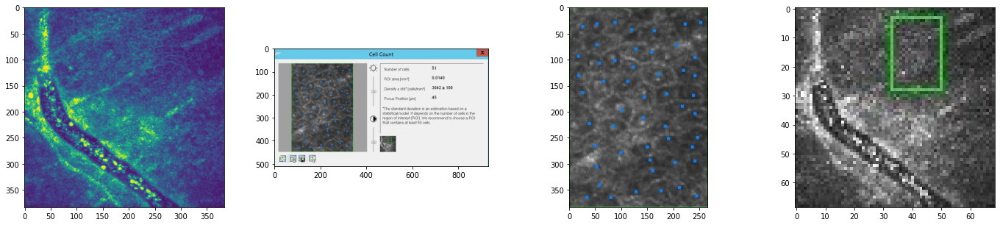

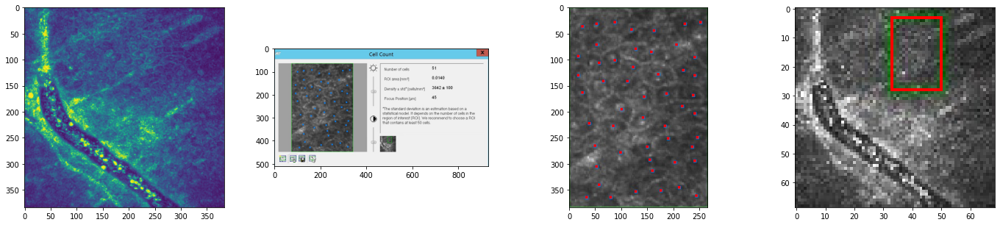

In [230]:
sample_num = 0

print(sample_num)
results = preprocess_img(original_imgs[sample_num], count_imgs[sample_num], big_count_imgs[sample_num], small_count_imgs[sample_num], threshold[sample_num], bbox_correction[sample_num], True)

In [231]:
centroids = []
bboxs = []

for i in tqdm(range(len(original_imgs))):
    centroid, bbox = preprocess_img(original_imgs[i], count_imgs[i], big_count_imgs[i], small_count_imgs[i], threshold[i], bbox_correction[i])
    centroids.append(centroid)
    bboxs.append(bbox)

# Alignment

In [232]:
def align_img(original_img, big_img, bbox, offset_x, offset_y, offset_size_x, offset_size_y):
    
    temp_bbox = bbox.copy()
    temp_bbox[0] += offset_x
    temp_bbox[2] += offset_x + offset_size_x
    temp_bbox[1] += offset_y 
    temp_bbox[3] += offset_y + offset_size_y
            
    return temp_bbox
        

def crop_img(original_path, big_path, small_path, centroid, bbox, img_type, offset_x, offset_y, offset_size_x, offset_size_y, plot=False):
    original_img = Image.open(original_path)
    big_img = Image.open(big_path)
    small_img = Image.open(small_path)
    
    original_shape = original_img.size
    small_shape = small_img.size
    big_shape = big_img.size
    
    big_img_aspect_ratio = float(big_shape[1]) / float(big_shape[0])
    original_img_x_scale = float(original_shape[0]) / float(small_shape[0]) 
    original_img_y_scale = float(original_shape[1]) / float(small_shape[1]) 
    
    scale_bbox = np.array([bbox[1], bbox[0], bbox[3], bbox[2]]).astype('float')
    
    scale_bbox[0] *= original_img_x_scale
    scale_bbox[2] *= original_img_x_scale
    scale_bbox[1] *= original_img_y_scale
#     scale_bbox[3] = scale_bbox[1] + big_img_aspect_ratio * (scale_bbox[2] - scale_bbox[0])
    scale_bbox[3] *= original_img_y_scale

    
    scale_bbox = scale_bbox.astype('int')
    
    scale_bbox = align_img(original_img, big_img, scale_bbox, offset_x, offset_y, offset_size_x, offset_size_y)
#     print(bbox)
#     print(original_shape, small_shape)
    
    crop_img = original_img.crop(scale_bbox)
    crop_img = crop_img.resize(big_img.size)
    
    centroid_x_scale = float(big_shape[0]) / float(crop_img.size[0]) 
    centroid_y_scale = float(big_shape[1]) / float(crop_img.size[1]) 

    scale_centroid = centroid.copy().astype('float')
    scale_centroid[:, 0] /= centroid_y_scale
    scale_centroid[:, 1] /= centroid_x_scale
    scale_centroid = scale_centroid.astype('int')
    
    print(big_shape, crop_img.size, centroid_x_scale, centroid_y_scale)
    
    if plot:
        draw = ImageDraw.Draw(crop_img)
        s = 1
        for point in scale_centroid:
            draw.rectangle([point[1] - s, point[0] - s, point[1] + s, point[0] + s], fill=255)

        fig, axs = plt.subplots(1, 2, figsize=(24, 10))

    #     axs[0].imshow(original_img, cmap='gray')
    #     axs[1].imshow(small_img)
        axs[0].imshow(big_img)
        axs[1].imshow(crop_img, cmap='gray')
        plt.show()
        
    return crop_img, centroid, img_type, scale_bbox
    

In [233]:
alignment_xy = [
    [5, 3, 5, 5],
    [5, 4, 5, 5],
    [4, 1, 8, 6],
    [6, 4, 6, 4],
    [3, 5, 8, 4],
    [5, 1, 2, 6],
    [4, 1, 4, 8],
    [10, -2, 4, 8],
    [2, 0, 12, 8],
    [np.nan, np.nan,np.nan,np.nan],
    [6, 2, 6, 6],
    [7, 4, 4, 4],
    [3, 6, 10, 0],
    [np.nan, np.nan,np.nan,np.nan],
    [4, 2, 14, 8],
    [4, 3, 0 ,0],
    [6, 0, 4 ,0],
    [5, -2, 12, 8],
    [8, 5, 8, 4],
    [7, 3, 4, 0],
    [4, 3, 6, 6],
    [5, 4, 2, 2],
    [4, -3, 4, 0],
    [4, -2, 4, 4],
    [2, 2, 0, 0],
    [3, 0, 0, 0],
    [7, 2, -2, 0],
    [10, -5, 0, 0],
    [6, -2, 0, 0],
    [6, 4, 6, 0],
    [6, 2, 0, 0],
    [5, 0, 0, 0],
    [4, -1, 10, 0],
    [2, 4, 8, 4],
    [5, 5, 6, 4],
    [4, 2, 10, 6],
    [3, 2, 12, 8],
    [9, 2, 0, 4],
    [12, 2, 8, 0],
    [np.nan, np.nan,np.nan,np.nan],
    [5, 2, 8, 4],
    [6, 2, -6, 0],
    [8, 10, 0, 0],
    [4, 9, 12, 8],
    [9, 10, -2, 0]
]

In [235]:
df = pd.DataFrame(columns=['img_name', 'id', 'type', 'count'])
original_dir = create_folder(data_dir / 'original')
count_dir = create_folder(data_dir / 'count')

for i in tqdm(range(len(alignment_xy))):
    if np.isnan(alignment_xy[i][0]):
        continue
    
    img, centroid, img_type, bbox = crop_img(original_imgs[i],
                                             big_count_imgs[i],
                                             small_count_imgs[i],
                                             centroids[i],
                                             bboxs[i],
                                             img_types[i],
                                             alignment_xy[i][0], alignment_xy[i][1], alignment_xy[i][2], alignment_xy[i][3])
    
    img.save(save_img_dir / '{:03d}.jpg'.format(i))
    Image.open(original_imgs[i]).save(original_dir / '{:03d}.jpg'.format(i))
    Image.open(big_count_imgs[i]).save(count_dir / '{:03d}.jpg'.format(i))

    for point in centroid:
        entry = {"img_name": '{:03d}.jpg'.format(i), "id": i, "type": img_types[i], "centroid_x": point[0], "centroid_y": point[1],
                 "count": len(centroid), "bbox_xmin": bbox[0], "bbox_ymin": bbox[1], "bbox_xmax": bbox[2], "bbox_ymax": bbox[3]}
        df = df.append(entry, ignore_index = True)
        

df.to_csv(data_dir / 'metadata.csv')

    
    

(266, 384) (266, 384) 1.0 1.0
(187, 384) (187, 384) 1.0 1.0
(384, 181) (384, 181) 1.0 1.0
(310, 384) (310, 384) 1.0 1.0
(243, 384) (243, 384) 1.0 1.0
(229, 384) (229, 384) 1.0 1.0
(221, 384) (221, 384) 1.0 1.0
(384, 247) (384, 247) 1.0 1.0
(384, 179) (384, 179) 1.0 1.0
(255, 384) (255, 384) 1.0 1.0
(223, 384) (223, 384) 1.0 1.0
(384, 93) (384, 93) 1.0 1.0
(384, 247) (384, 247) 1.0 1.0
(136, 117) (136, 117) 1.0 1.0
(384, 213) (384, 213) 1.0 1.0
(384, 139) (384, 139) 1.0 1.0
(384, 311) (384, 311) 1.0 1.0
(384, 241) (384, 241) 1.0 1.0
(384, 229) (384, 229) 1.0 1.0
(371, 384) (371, 384) 1.0 1.0
(132, 82) (132, 82) 1.0 1.0
(150, 64) (150, 64) 1.0 1.0
(134, 132) (134, 132) 1.0 1.0
(137, 73) (137, 73) 1.0 1.0
(156, 124) (156, 124) 1.0 1.0
(156, 124) (156, 124) 1.0 1.0
(89, 147) (89, 147) 1.0 1.0
(138, 114) (138, 114) 1.0 1.0
(128, 92) (128, 92) 1.0 1.0
(121, 106) (121, 106) 1.0 1.0
(255, 82) (255, 82) 1.0 1.0
(199, 384) (199, 384) 1.0 1.0
(364, 384) (364, 384) 1.0 1.0
(384, 286) (384, 286) 1.

# Generate ground truth

In [50]:
data_dir = Path('./data/BCD')
processed_img_dir = data_dir / 'ProcessedImg'
df = pd.read_csv(data_dir / 'metadata.csv')

In [56]:
area_list = [
    0.014,
    0.0114,
    0.0352,
    0.0152,
    0.0172,
    0.0173,
    0.0128,
    0.0147,
    0.012,
    0.0082,
    0.0105,
    0.0086,
    0.0106,
    0.0165,
    0.0183,
    0.0187,
    0.0153,
    0.0251,
    0.0244,
    0.0167,
    0.0115,
    0.0098,
    0.0176,
    0.0103,
    0.0184,
    0.0191,
    0.0133,
    0.0164,
    0.0107,
    0.0133,
    0.0206,
    0.0121,
    0.0106,
    0.0164,
    0.0151,
    0.0121,
    0.0173,
    0.0086,
    0.0101,
    0.0141,
    0.0210,
    0.0132
]

area_list = np.array(area_list)

(449, 311, 3) (449, 311)


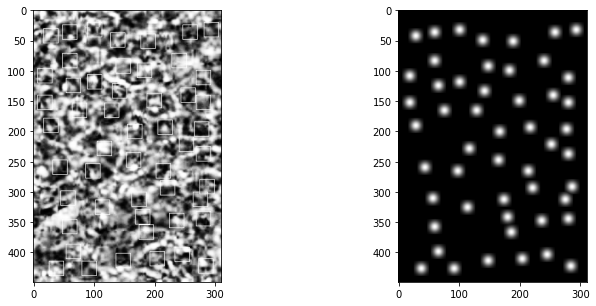

(311, 449)
(483, 235, 3) (483, 235)


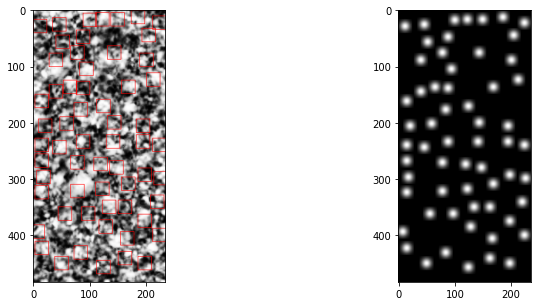

(235, 483)
(407, 864, 3) (407, 864)


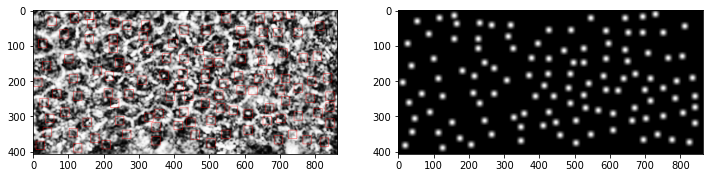

(864, 407)
(433, 350, 3) (433, 350)


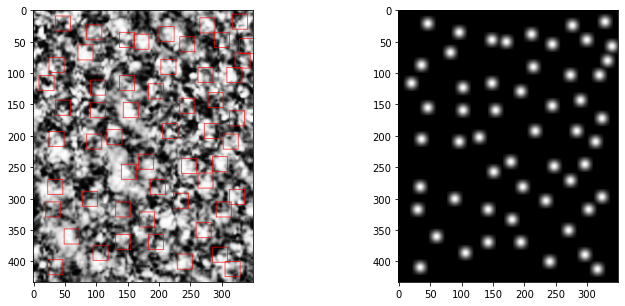

(350, 433)
(521, 329, 3) (521, 329)


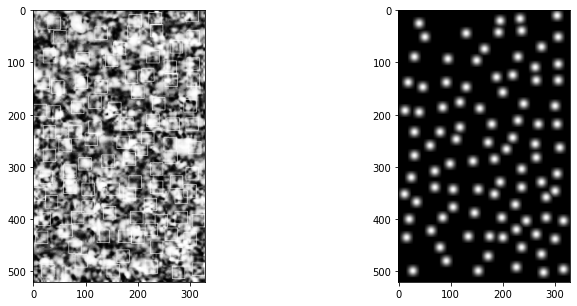

(329, 521)
(538, 321, 3) (538, 321)


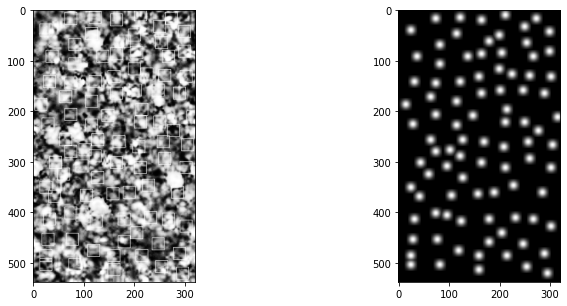

(321, 538)
(471, 271, 3) (471, 271)


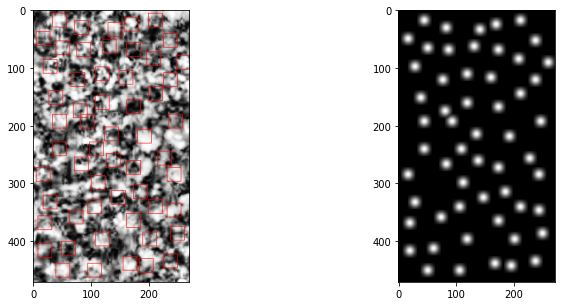

(271, 471)
(307, 478, 3) (307, 478)


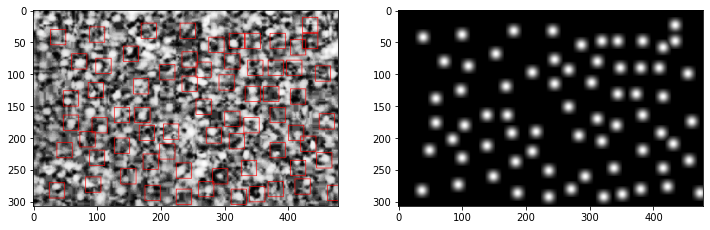

(478, 307)
(236, 507, 3) (236, 507)


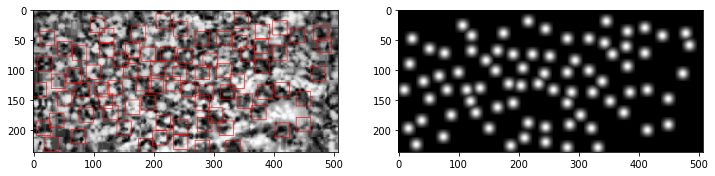

(507, 236)
(351, 233, 3) (351, 233)


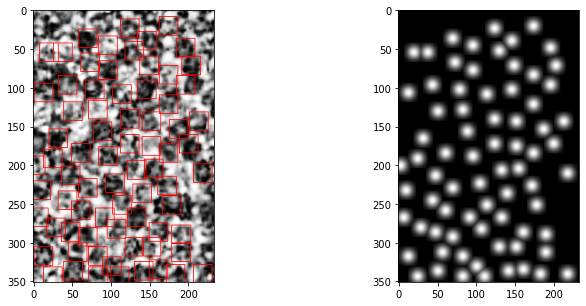

(233, 351)
(425, 246, 3) (425, 246)


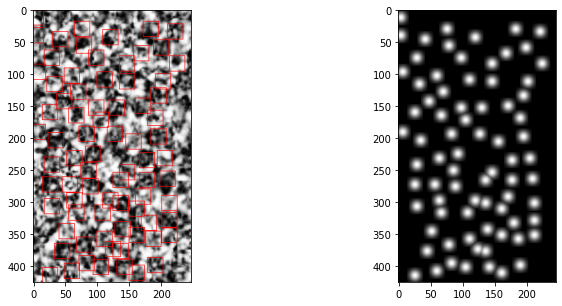

(246, 425)
(144, 595, 3) (144, 595)


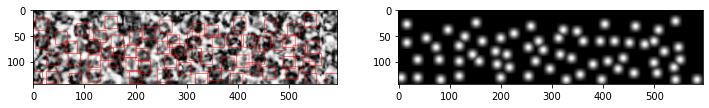

(595, 144)
(261, 405, 3) (261, 405)


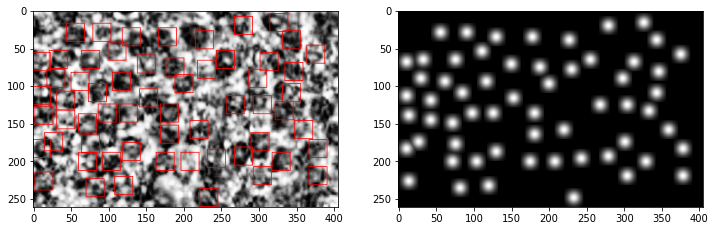

(405, 261)
(376, 437, 3) (376, 437)


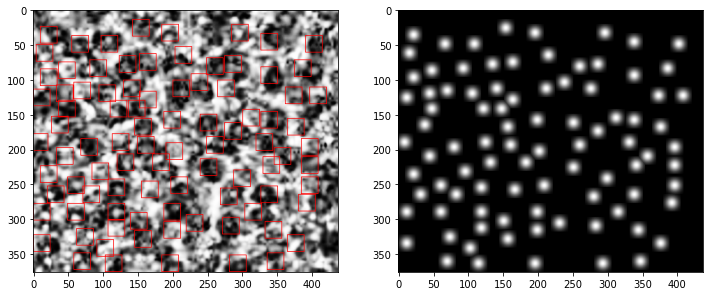

(437, 376)
(318, 574, 3) (318, 574)


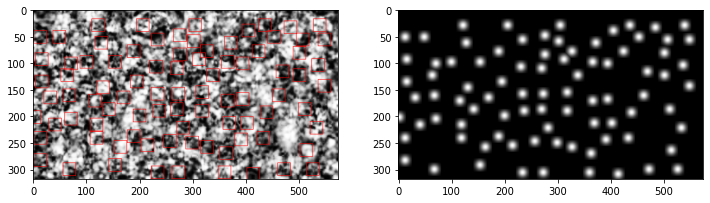

(574, 318)
(260, 718, 3) (260, 718)


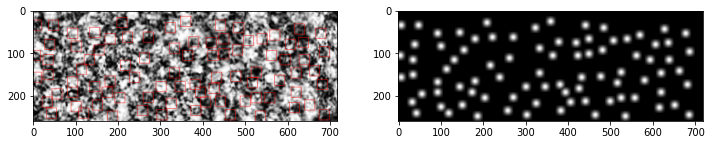

(718, 260)
(352, 434, 3) (352, 434)


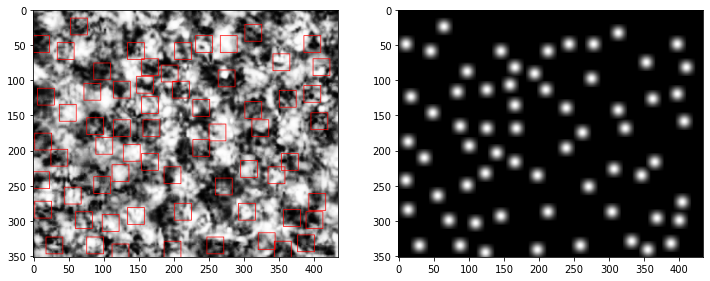

(434, 352)
(396, 632, 3) (396, 632)


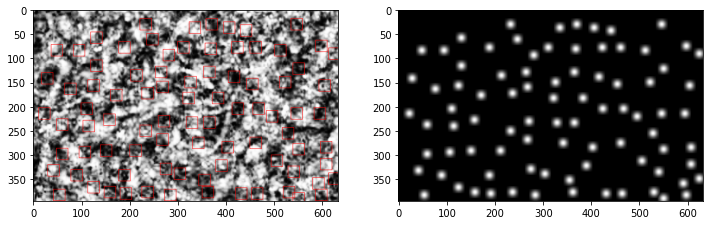

(632, 396)
(381, 639, 3) (381, 639)


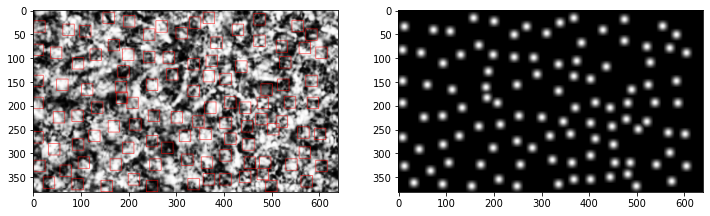

(639, 381)
(415, 401, 3) (415, 401)


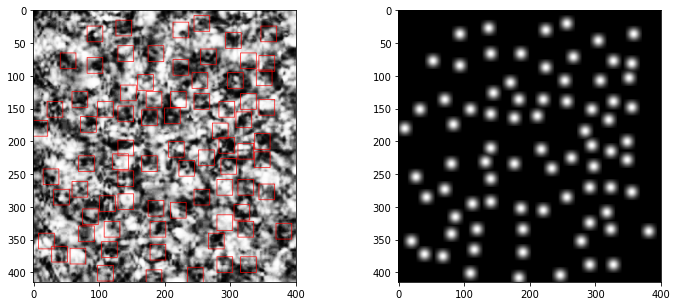

(401, 415)
(267, 430, 3) (267, 430)


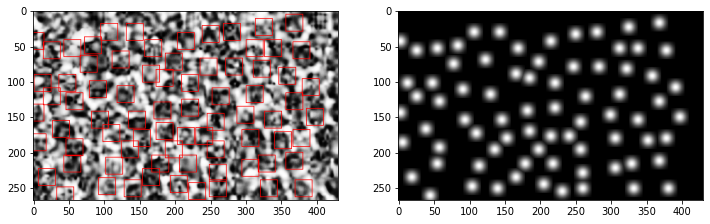

(430, 267)
(204, 479, 3) (204, 479)


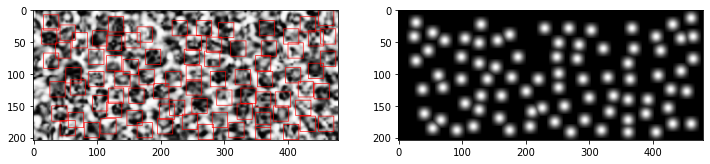

(479, 204)
(416, 422, 3) (416, 422)


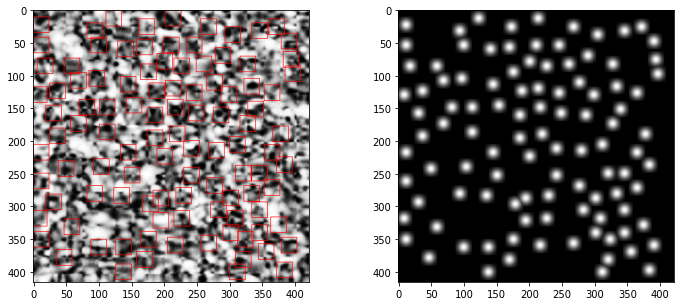

(422, 416)
(234, 439, 3) (234, 439)


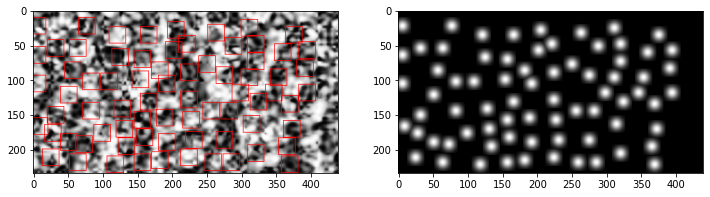

(439, 234)
(382, 481, 3) (382, 481)


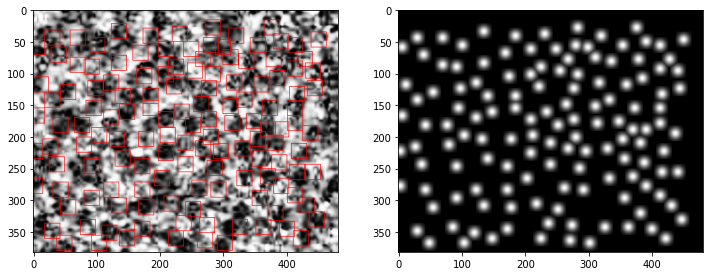

(481, 382)
(389, 490, 3) (389, 490)


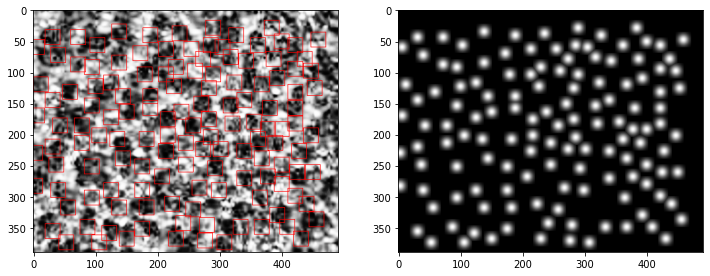

(490, 389)
(468, 283, 3) (468, 283)


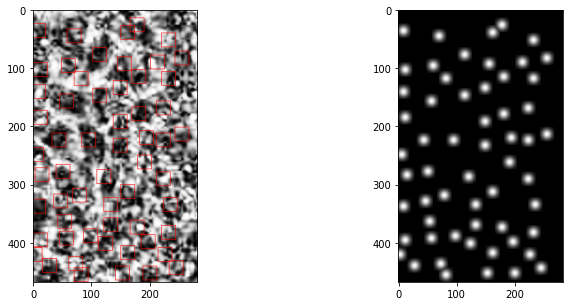

(283, 468)
(368, 445, 3) (368, 445)


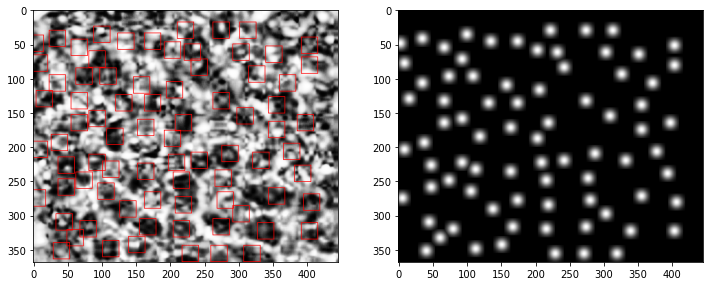

(445, 368)
(277, 385, 3) (277, 385)


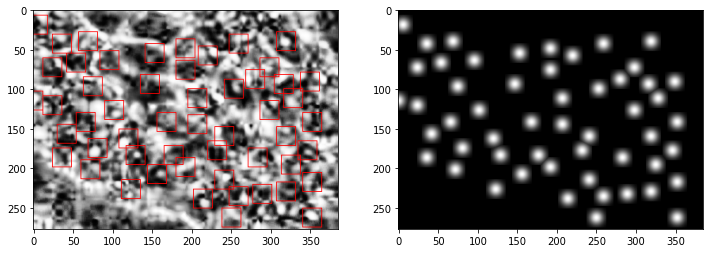

(385, 277)
(341, 389, 3) (341, 389)


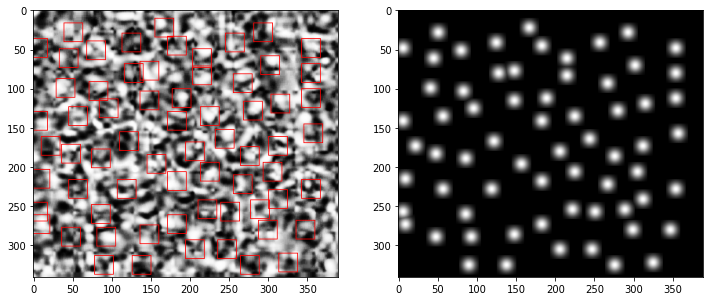

(389, 341)
(257, 800, 3) (257, 800)


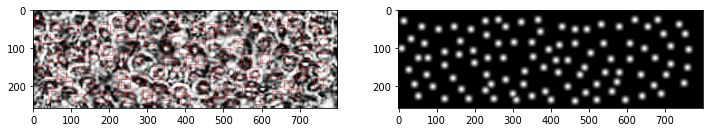

(800, 257)
(483, 250, 3) (483, 250)


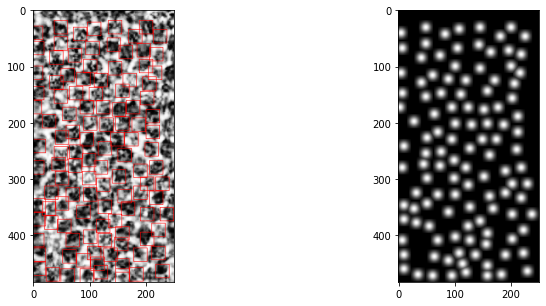

(250, 483)
(334, 316, 3) (334, 316)


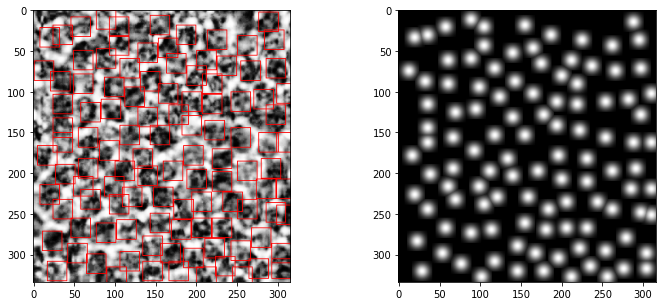

(316, 334)
(349, 469, 3) (349, 469)


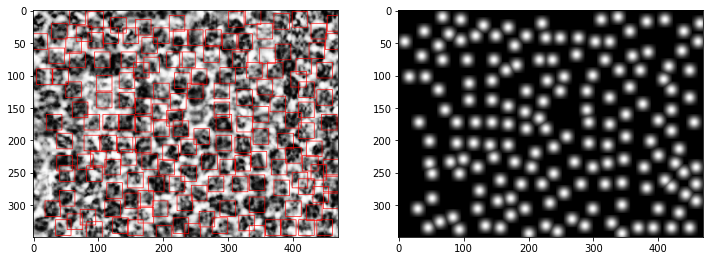

(469, 349)
(296, 509, 3) (296, 509)


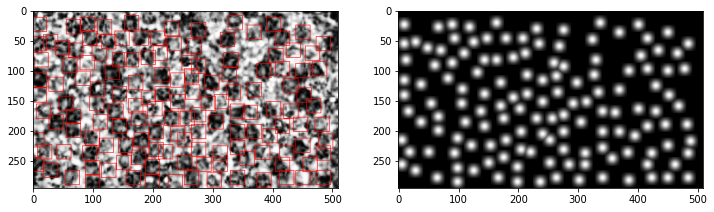

(509, 296)
(316, 382, 3) (316, 382)


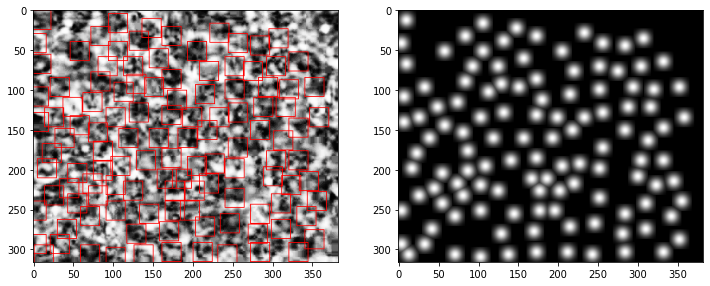

(382, 316)
(387, 446, 3) (387, 446)


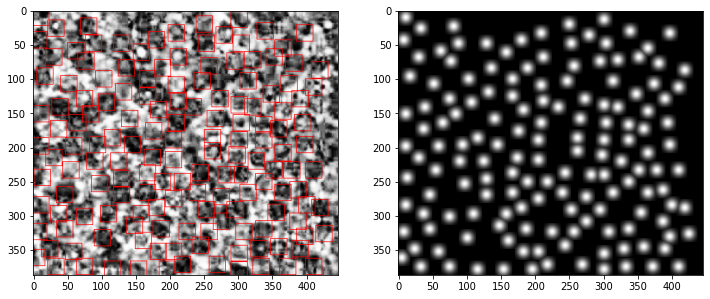

(446, 387)
(190, 451, 3) (190, 451)


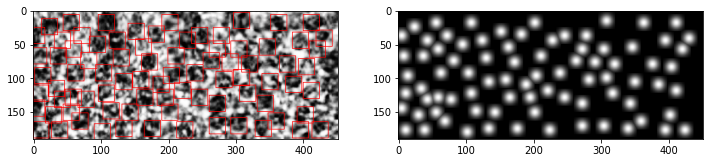

(451, 190)
(251, 401, 3) (251, 401)


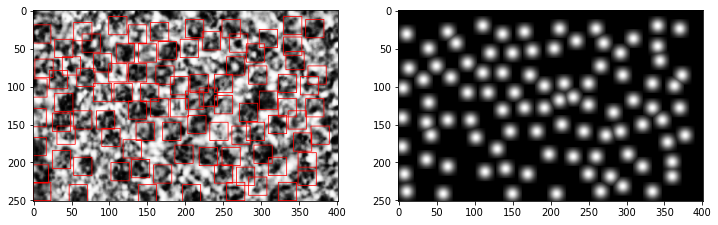

(401, 251)
(607, 232, 3) (607, 232)


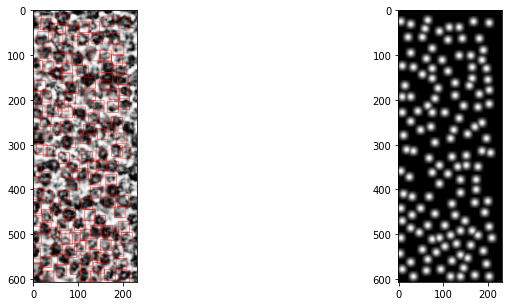

(232, 607)
(615, 341, 3) (615, 341)


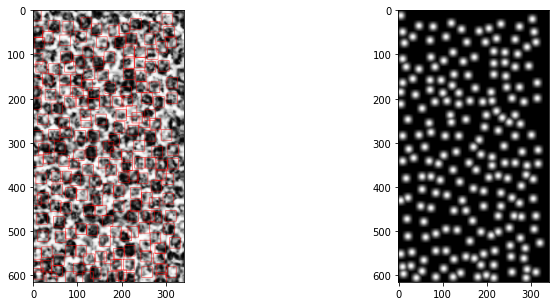

(341, 615)
(306, 431, 3) (306, 431)


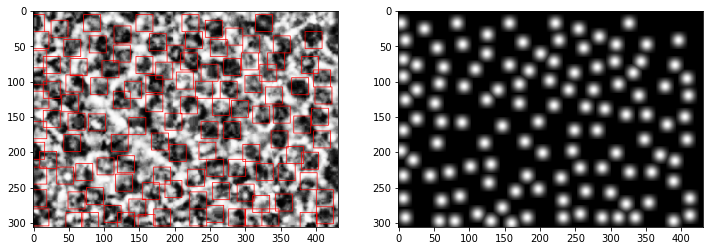

(431, 306)



In [72]:
from skimage.io import imread, imsave, call_plugin
from skimage import data, color
from skimage.transform import rescale
from skimage.util import img_as_float, img_as_ubyte
import matplotlib.pyplot as plt
from skimage.filters import unsharp_mask
from skimage import exposure
import cv2

def constant_zoom_scale(centroids, img, area, constant_ratio = 2.0):
#     y_length = img.size[0]
#     original_y_length = original_img.size[0]
#     bbox_y_length = bbox[3] - bbox[1]
    
#     original2bbox_ratio = float(bbox_y_length) / float(original_y_length)

#     bbox2img_ratio = float(y_length) / float(bbox_y_length)
#     final_ratio = constant_ratio / (original2bbox_ratio * bbox2img_ratio)
    
    final_ratio = np.sqrt(constant_ratio * 5000000. / (float(img.size[0] * img.size[1]) / area))
    

    
    rescale_centroids = centroids * final_ratio
    rescale_shape = (np.array(img.size).astype('float') * final_ratio).astype('int')
    rescale_img = img.resize(rescale_shape)
    
#     print(float(rescale_img.size[0] * rescale_img.size[1]) / area)
#     print(rescale_img.size)

    
    return rescale_centroids, rescale_img
    
def sharpen(img):
    im = img_as_ubyte(np.array(img))
    equalized = exposure.equalize_adapthist(im, clip_limit=0.1)
#     sharpen_img = unsharp_mask(equalized, radius=5, amount=2)
    sharpen_img = equalized

    return Image.fromarray(img_as_ubyte(sharpen_img))

def generate_diffusion(max_size):
    g_range = 2
    X,Y=np.meshgrid(np.linspace(-g_range,g_range,max_size),np.linspace(-g_range,g_range,max_size));
    mu,sigma=0,1;
    G=np.exp(-((X-mu)**2+(Y-mu)**2)/2.0*sigma**2)

    return G / (1./ (np.max(G)))

def generate_difusion_map(xy_coord, size, max_distance):
    additional_width = int(np.max(size) * 0.2)
    max_size = size + 2*additional_width
    img_arr = np.full(max_size, 0.0)
    diff_arr = generate_diffusion(max_distance)
    diff_distance = int(np.floor(diff_arr.shape[0]/2.))
    
    
    for i in xy_coord:
        y = int(i[0] + additional_width)
        x = int(i[1] + additional_width)
        temp_arr = img_arr[x - diff_distance: x + diff_distance + 1, y - diff_distance: y + diff_distance + 1]
        temp_arr = np.maximum(temp_arr, diff_arr)
        img_arr[x - diff_distance: x + diff_distance + 1, y - diff_distance: y + diff_distance + 1] = temp_arr
        
    return np.transpose(img_arr[additional_width: additional_width + size[0], additional_width: additional_width + size[1]])



def generate_img_array(img_path):
    img = cv2.imread(str(img_path), 0)
        
#     laplacian = cv2.Laplacian(img,cv2.CV_64F, ksize=21)
    sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=21)
    sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=21)
    
    img = np.expand_dims(img, axis=-1)
#     laplacian = np.expand_dims(laplacian, axis=-1)
    sobelx = np.expand_dims(sobelx, axis=-1)
    sobely = np.expand_dims(sobely, axis=-1)

    final_arr = np.concatenate((img, sobelx, sobely), axis=-1)
    
    return final_arr

ids = np.unique(df['id'].values)
sharpen_img_dir = create_folder(data_dir / 'sharpen_area_img')
upscale_img_dir = create_folder(data_dir / 'upscale_area_img')
proximity_img_dir = create_folder(data_dir / 'proximity_area_map')
gradient_img_dir = create_folder(data_dir / 'gradient_area_img')
original_img_dir = data_dir / 'original'

area_count = 0
for single_id in tqdm(ids, total=len(ids)):
    
        
    
    single_df = df[df['id'] == single_id]
    
    centroids = np.transpose(np.stack((single_df['centroid_x'].values, single_df['centroid_y'].values)))
#     print(area_count, len(centroids))
    if np.isnan(area_list[area_count]):
        area_count += 1
        continue
    
    count = np.unique(single_df['count'].values)[0]
    bbox = [np.unique(single_df['bbox_xmin'].values)[0], 
            np.unique(single_df['bbox_ymin'].values)[0], 
            np.unique(single_df['bbox_xmax'].values)[0], 
            np.unique(single_df['bbox_ymax'].values)[0]]
    bbox = np.array(bbox)
    
    img_path = processed_img_dir / np.unique(single_df['img_name'].values)[0]
    img = Image.open(img_path)
    
    rescale_centroids, rescale_img = constant_zoom_scale(centroids,
                                                         img,
                                                         area_list[area_count])    
    sharpen_img = sharpen(rescale_img)
    img_arr = generate_difusion_map(rescale_centroids, np.array(rescale_img.size), 25)
    
    centroid_area = np.sqrt(float(rescale_img.size[0] * rescale_img.size[1]) / float(len(rescale_centroids)))
    
    np.savetxt(proximity_img_dir / '{:03}.csv'.format(single_id), img_arr, delimiter=',')
    sharpen_img.save(sharpen_img_dir / '{:03}.jpg'.format(single_id), mode='L')
    rescale_img.save(upscale_img_dir / '{:03}.jpg'.format(single_id), mode='L')
    
    gradient_arr = generate_img_array(sharpen_img_dir / '{:03}.jpg'.format(single_id))
    print(gradient_arr.shape, img_arr.shape)
#     with open(, 'wb') as f:
    np.save(gradient_img_dir / '{:03}.npy'.format(single_id), gradient_arr)
    
    area_count+= 1
    draw = ImageDraw.Draw(sharpen_img)
    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    
    
    s = 12
    for centroid in rescale_centroids:
        draw.rectangle([centroid[1] - s, centroid[0] - s, centroid[1] + s, centroid[0] + s], outline=255)
        
    axs[0].imshow(sharpen_img, cmap='gray')
    axs[1].imshow(Image.fromarray((img_arr*255).astype('uint8')), cmap='gray')
    plt.show()
    print(sharpen_img.size)
        

In [5]:
data_dir = Path('./data/BCD')
sharpen_img_dir = create_folder(data_dir / 'sharpen_area_img')
upscale_img_dir = create_folder(data_dir / 'upscale_area_img')
proximity_img_dir = create_folder(data_dir / 'proximity_area_map')
original_img_dir = data_dir / 'original'

In [6]:
sharpen_img_list = os.listdir(sharpen_img_dir)
sharpen_img_list.sort()
upscale_img_list = os.listdir(upscale_img_dir)
upscale_img_list.sort()

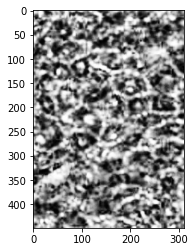

In [7]:
for single_img in sharpen_img_list:
    img = Image.open(sharpen_img_dir / single_img)
    plt.imshow(img, cmap='gray')
    break

(307, 478, 1) (307, 478, 1) (307, 478, 1) (307, 478, 1)
(307, 478, 4)
[-7.43551795e+11 -7.19976792e+11 -6.95892574e+11 ...  2.97602941e+11
  2.97923838e+11  2.98551345e+11]
[-1.57687964e+12 -1.56655588e+12 -1.53904023e+12 ...  1.60730133e+12
  1.61671740e+12  1.65428510e+12]
[-2.20579608e+12 -2.20134581e+12 -2.19538296e+12 ...  1.60552042e+12
  1.65871622e+12  1.66335805e+12]
(307, 478)


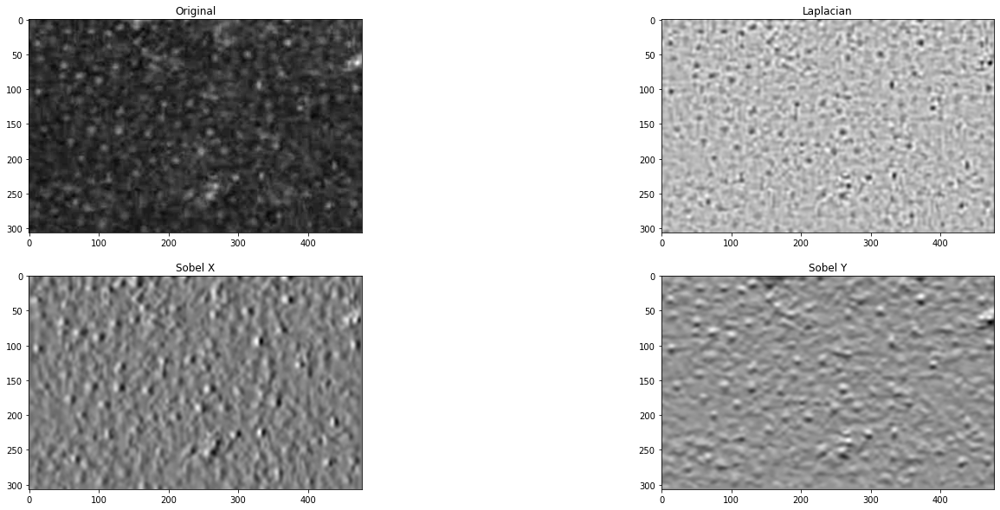

In [64]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

def generate_img_array(img_path):
    img = cv2.imread(str(img_path), 0)
        
    laplacian = cv2.Laplacian(img,cv2.CV_64F, ksize=21)
    sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=21)
    sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=21)
    
    img = np.expand_dims(img, axis=-1)
    laplacian = np.expand_dims(laplacian, axis=-1)
    sobelx = np.expand_dims(sobelx, axis=-1)
    sobely = np.expand_dims(sobely, axis=-1)

    final_arr = np.concatenate((img, laplacian, sobelx, sobely), axis=-1)
    print(final_arr.shape)
    
    return final_arr

sample_num = 7
   
generate_img_array(upscale_img_dir / sharpen_img_list[sample_num])


img = cv2.imread(str(upscale_img_dir / sharpen_img_list[sample_num]),0)

laplacian = cv2.Laplacian(img,cv2.CV_64F, ksize=21)
# laplacian = np.absolute(laplacian)
# laplacian = np.uint8(np.absolute(laplacian))

sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=21)
# sobelx= np.uint8(np.absolute(sobelx))

sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=21)
# sobely = np.uint8(np.absolute(sobely))

print(np.unique(laplacian))
print(np.unique(sobelx))
print(np.unique(sobely))

print(img.shape)

fig, axs = plt.subplots(2, 2, figsize=(24, 10))
axs[0, 0].imshow(img,cmap = 'gray')
axs[0, 0].set_title('Original')

axs[0, 1].imshow(laplacian,cmap = 'gray')
axs[0, 1].set_title('Laplacian')

axs[1, 0].imshow(sobelx,cmap = 'gray')
axs[1, 0].set_title('Sobel X')

axs[1, 1].imshow(sobely,cmap = 'gray')
axs[1, 1].set_title('Sobel Y')

plt.show()

[-5.27040197e+12 -5.05650086e+12 -4.96611833e+12 ...  5.86589458e+12
  6.09850858e+12  6.18819591e+12]
[-1.88972362e+13 -1.87584325e+13 -1.86671476e+13 ...  1.83107476e+13
  1.84113809e+13  1.85556859e+13]
[-1.88358140e+13 -1.87843472e+13 -1.84439512e+13 ...  1.79107326e+13
  1.81916991e+13  1.81943063e+13]
(307, 478)


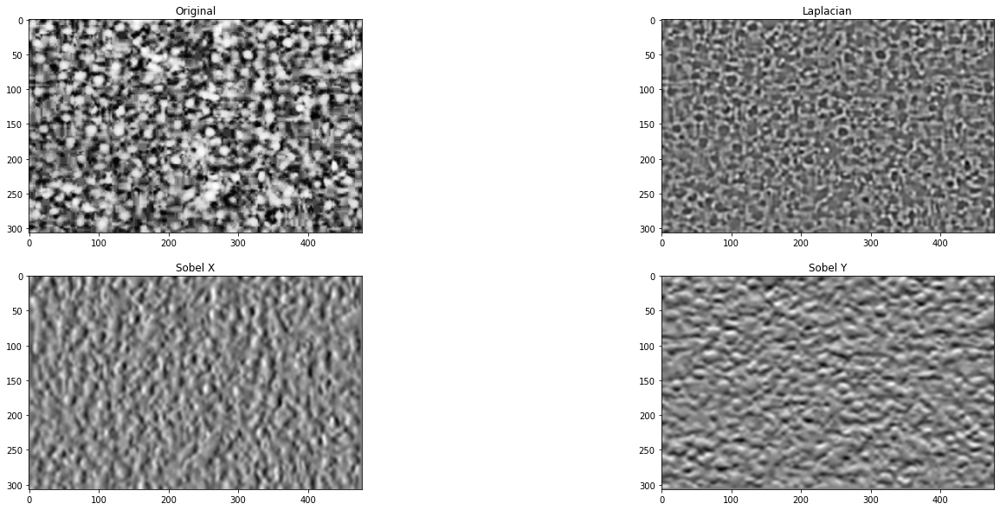

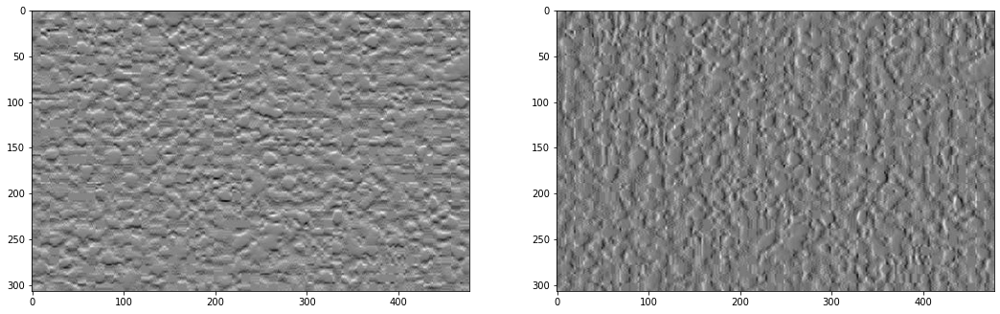

In [48]:
import cv2
import numpy as np
from matplotlib import pyplot as plt

sample_num = 7

img = cv2.imread(str(sharpen_img_dir / sharpen_img_list[sample_num]),0)


laplacian = cv2.Laplacian(img,cv2.CV_64F, ksize=21)
# laplacian = np.absolute(laplacian)
# laplacian = np.uint8(np.absolute(laplacian))

sobelx = cv2.Sobel(img,cv2.CV_64F,1,0,ksize=21)
# sobelx= np.uint8(np.absolute(sobelx))

sobely = cv2.Sobel(img,cv2.CV_64F,0,1,ksize=21)
# sobely = np.uint8(np.absolute(sobely))

print(np.unique(laplacian))
print(np.unique(sobelx))
print(np.unique(sobely))

print(img.shape)

fig, axs = plt.subplots(2, 2, figsize=(24, 10))
axs[0, 0].imshow(img,cmap = 'gray')
axs[0, 0].set_title('Original')

axs[0, 1].imshow(laplacian,cmap = 'gray')
axs[0, 1].set_title('Laplacian')

axs[1, 0].imshow(sobelx,cmap = 'gray')
axs[1, 0].set_title('Sobel X')

axs[1, 1].imshow(sobely,cmap = 'gray')
axs[1, 1].set_title('Sobel Y')

plt.show()
gradient = np.gradient(img)
# print(gradient.shape)
fig, axs = plt.subplots(1, 2, figsize=(18, 10))
axs[0].imshow(gradient[0],cmap = 'gray')
axs[1].imshow(gradient[1],cmap = 'gray')
plt.show()